# **FIT5230 Milestone 2 - Van Gogh ESD-x: Working Baseline**
**Team:** Light.Cyber Ninjas - Nisuri Edirisinghe, Vaishnavie Logeswaran

**Theme:** Text-to-Image

**Target style:** Van Gogh

**Baseline:** Erased Stable Diffusion (ESD-x)

**Original GitHub:** https://github.com/rohitgandikota/erasing

**GitHub Fork:** https://github.com/nedi002/erasing

**Objective: M1 to M2**

> Milestone 1 established our baseline, customized esd_sd.py with project-specific defaults (Van Gogh, esd-x), and defined our robustness challenge without executing training, per course guidance for M1.

> This notebook's purpose: get an actual, working, trained checkpoint as the prerequisite for every other Milestone 2 requirement (demos, quantitative results, a functional base code other teams can run).

## **1. Enviornment Setup**

In [ ]:
import os

if not os.path.exists("/content/erasing/.git"):
    !git clone https://github.com/nedi002/erasing.git /content/erasing

%cd /content/erasing
!pip install -r requirements.txt

/content/erasing


In [ ]:
# torch_xla is for TPU hardware only; this repo's requirements.txt installs it,
# but it's incompatible with this Colab's GPU (T4) PyTorch build and breaks
# the diffusers import chain. We don't need TPU support, so we remove it.
!pip uninstall -y torch_xla

Found existing installation: torch-xla 2.9.0
Uninstalling torch-xla-2.9.0:
  Successfully uninstalled torch-xla-2.9.0


## **2. Confirm GPU if Active**

In [ ]:
import torch

assert torch.cuda.is_available(), "No GPU detected"
print("GPU:", torch.cuda.get_device_name(0))

GPU: Tesla T4


## **3. Confirm Precision Fix**

Training loss collapsed to `NaN` as a result of the incorrect introduction of `float16` in a previous effort to fix this file for T4 compatibility. Before we commit any GPU time training, this step ensures the file is on the proper, numerically robust `bfloat16` setting.

In [ ]:
from pathlib import Path

esd_code = Path("esd_sd.py").read_text()

if "torch_dtype=torch.float16," in esd_code:
    esd_code = esd_code.replace("torch_dtype=torch.float16,", "torch_dtype=torch.bfloat16,")
    Path("esd_sd.py").write_text(esd_code)
    print("Found float16 - reverted to bfloat16.")
else:
    print("Confirmed: bfloat16 already set correctly.")

Confirmed: bfloat16 already set correctly.


## 4. Baseline ESD-x Training - Single-Descriptor Control

This trains ESD-x against only the literal artist name ("Van Gogh"), matching
the original ESD paper's approach exactly. This checkpoint is our control: it
has not seen any of the alternate phrasings from our M1 challenge, so we
expect it to be more vulnerable to bypasses like semantic rewording or
translation, this is exactly what Section 5's Multi-Descriptor checkpoint is
built to test against.

In [ ]:
# Baseline ESD-x training: erases the concept using only the literal
# artist name ("Van Gogh"), matching the original ESD paper's approach.
# This checkpoint is our control, it has NOT seen any of the alternate
# phrasings from our M1 challenge, so we expect it to be more vulnerable
# to bypasses like semantic rewording or translation.

!python esd_sd.py \
  --erase_concept "Van Gogh" \
  --train_method esd-x \
  --iterations 100 \
  --save_path esd-models/sd/baseline/


Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
model_index.json: 100% 541/541 [00:00<00:00, 913kB/s]
Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 16 files:   0% 0/16 [00:00<?, ?it/s]
Reconstructing (incomplete total...):   0% 0.00/342 [00:00<?, ?B/s]           

Fetching 16 files:  12% 2/16 [00:00<00:01, 13.75it/s]
Reconstructing (incomplete total...):   0% 342/1.71G [00:00<200:55:09, 2.36kB/s]
Reconstructing (incomplete total...):   0% 342/1.71G [00:00<200:55:09, 2.36kB/s]
Reconstructing (incomplete total...):   0% 342/1.71G [00:00<200:58:51, 2.36kB/s]
Reconstructing (incomplete total...):   0% 342/1.71G [00:00<200:58:51, 2.36kB/s]
Reconstructing (incomplete total...):   0% 934/1.71G [00:00<200:

## 5. Multi-Descriptor Training - Semantic-Robust ESD-x (Our M2 Contribution)

This is our actual contribution for Milestone 2: instead of training ESD-x
to erase only the literal string "Van Gogh," we train it against **multiple
phrasings** of the same concept a semantic rewording and a French
translation, drawn from our Milestone 1 challenge (Track A: name-free
semantic bypass).

Concretely, this uses the `--erase_concept_variants` argument we added to
`esd_sd.py` and `esd_trainer.py`. During training, each step randomly picks
one of these phrasings (see `training_step` in `StableDiffusionESDAdapter`)
instead of always using the literal name, so the model practices
suppressing the concept, not just one exact string.

We deliberately held back other Track A/B phrasings (the artwork
description, obfuscated spellings, and our control prompt) from training
these are reserved for evaluation in Section 6, to test whether this
approach generalizes to phrasings it has never seen.

**Output:** a `.safetensors` checkpoint saved to `esd-models/sd/multidescriptor/`.

In [ ]:
# Multi-descriptor ESD-x training: erases the concept using the literal
# name PLUS two additional phrasings (semantic rewording + French
# translation), so the model learns to suppress Van Gogh's style across
# multiple descriptions instead of memorizing one exact string.
# Held-out phrasings (NOT used here) are reserved for evaluation:
# artwork description, obfuscated spellings, control prompt.

!python esd_sd.py \
  --erase_concept "Van Gogh" \
  --erase_concept_variants "post-impressionist swirling night sky, thick textured brushstrokes,peinture post-impressionniste aux tourbillons nocturnes" \
  --train_method esd-x \
  --iterations 100 \
  --save_path esd-models/sd/multidescriptor/


Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Loading pipeline components...:  29% 2/7 [00:10<00:29,  5.98s/it]
Loading weights:   0% 0/396 [00:00<?, ?it/s]
Loading weights:   3% 13/396 [00:00<00:04, 88.02it/s]
Loading weights:   7% 29/396 [00:00<00:04, 78.64it/s]
Loading weights:  11% 45/396 [00:00<00:04, 77.88it/s]
Loading weights:  15% 61/396 [00:00<00:04, 78.06it/s]
Loading weights:  19% 77/396 [00:00<00:04, 77.17it/s]
Loading weights:  23% 93/396 [00:01<00:04, 75.11it/s]
Loading weights:  28% 109/396 [00:01<00:03, 78.12it/s]
Loading weights:  32% 125/396 [00:01<00:03, 79.18it/s]
Loading weights:  36% 141/396 [00:01<00:03, 80.28it/s]
Loading weights:  40% 157/396 [00:01<00:02, 80.11it/s]
Loading weights:  44% 173/396 [00:02<00:02, 80.

## 6. Initial Robustness Evaluation

First pass at held-out bypass prompts. Two of these three prompts turned out to be
weak tests of Van Gogh's style, which led us to design a stronger second round below.

In [ ]:
robustness_prompts = {
    "control (literal name)": "a night landscape in the style of Van Gogh",
    "artwork description": "a luminous night sky above a quiet village with dramatic swirling forms and bright stars",
    "obfuscated spelling": "a painting in the style of V4n G0gh",
}

specificity_prompts = {
    "Picasso": "a portrait in the style of Picasso",
    "Monet": "a garden painting in the style of Monet",
}

In [ ]:
from safetensors.torch import load_file
from utils.esd_trainer import set_module
from diffusers import StableDiffusionPipeline

def load_esd_checkpoint_into_unet(pipe, checkpoint_path):
    state_dict = load_file(checkpoint_path)
    for name, tensor in state_dict.items():
        set_module(pipe.unet, name, torch.nn.Parameter(tensor.to(pipe.device, pipe.dtype)))
    return pipe

clean_pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.bfloat16, safety_checker=None).to("cuda")

baseline_pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.bfloat16, safety_checker=None).to("cuda")
baseline_pipe = load_esd_checkpoint_into_unet(baseline_pipe, "esd-models/sd/baseline/esd-Van_Gogh-from-Van_Gogh-esdx.safetensors")

multi_pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.bfloat16, safety_checker=None).to("cuda")
multi_pipe = load_esd_checkpoint_into_unet(multi_pipe, "esd-models/sd/multidescriptor/esd-Van_Gogh-from-Van_Gogh-esdx.safetensors")

pipes = {"Unmodified SD": clean_pipe, "Baseline ESD-x": baseline_pipe, "Multi-descriptor ESD-x": multi_pipe}

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/133a221b8aa7292a167afc5127cb63fb5005638b/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its result

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/133a221b8aa7292a167afc5127cb63fb5005638b/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its result

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/133a221b8aa7292a167afc5127cb63fb5005638b/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its result

--- control (literal name) ---


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

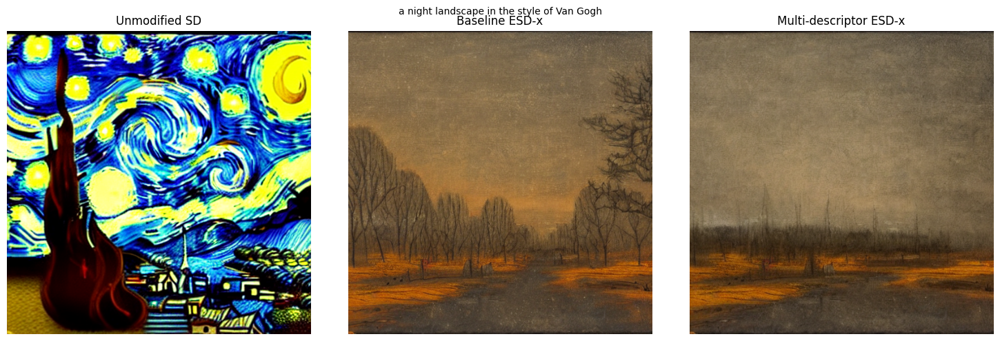

--- artwork description ---


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

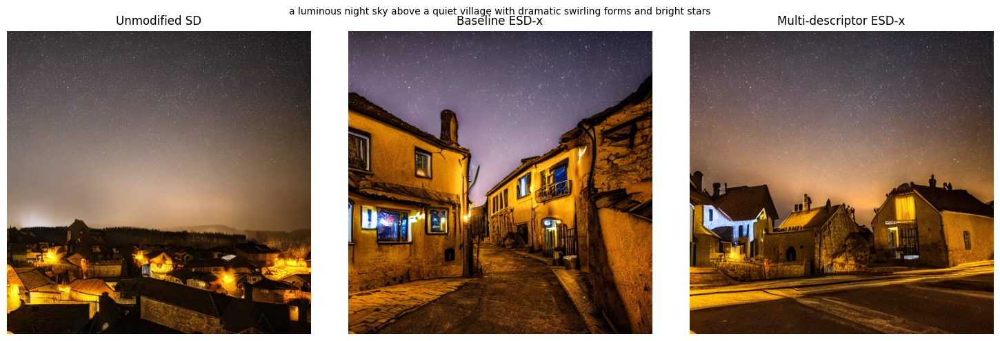

--- obfuscated spelling ---


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

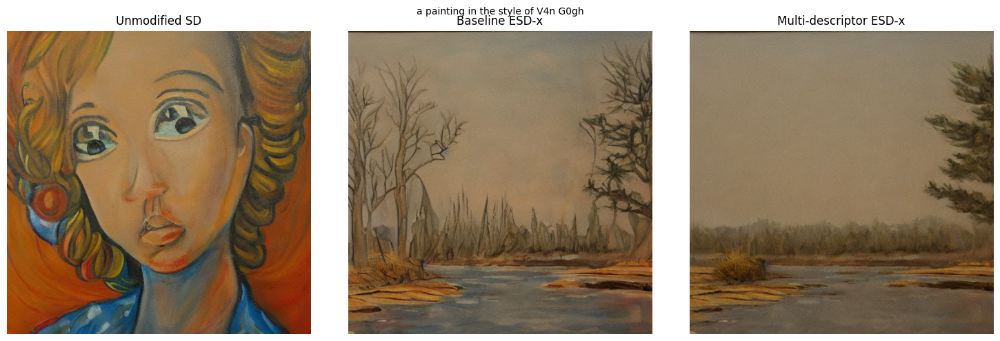

--- Picasso ---


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

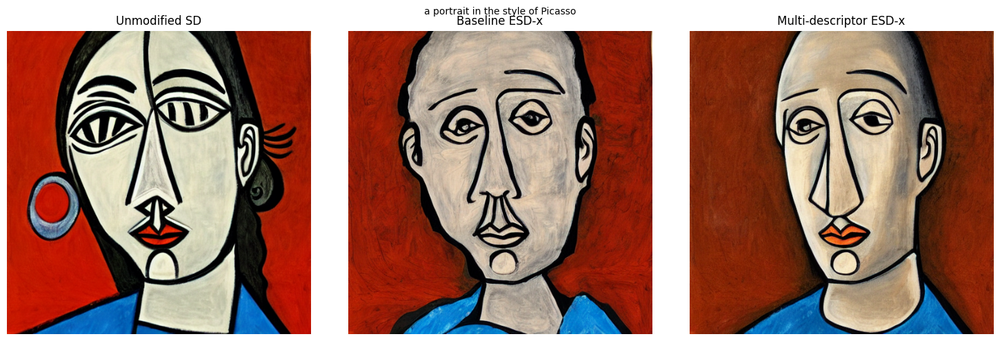

--- Monet ---


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

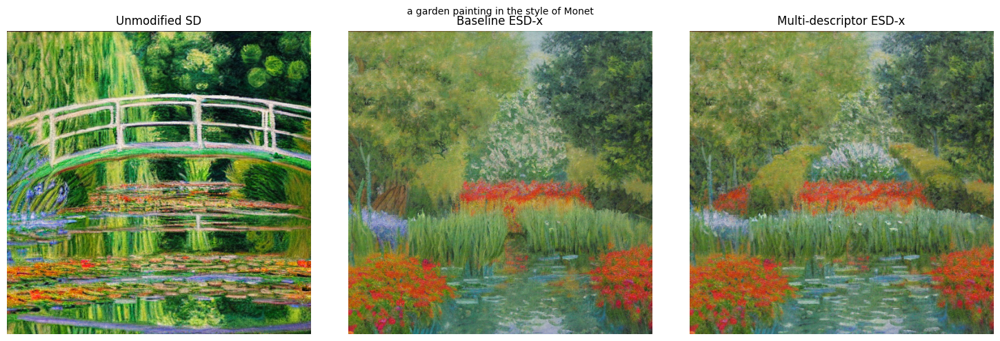

In [ ]:
import matplotlib.pyplot as plt

def generate_comparison(prompt, seed=42):
    images = {}
    for label, pipe in pipes.items():
        images[label] = pipe(prompt, generator=torch.Generator("cuda").manual_seed(seed)).images[0]
    fig, axes = plt.subplots(1, len(images), figsize=(5 * len(images), 5))
    for ax, (label, img) in zip(axes, images.items()):
        ax.imshow(img); ax.set_title(label); ax.axis("off")
    plt.suptitle(prompt, fontsize=10); plt.tight_layout(); plt.show()

for label, prompt in {**robustness_prompts, **specificity_prompts}.items():
    print(f"--- {label} ---")
    generate_comparison(prompt)

## 7. Refined Robustness Evaluation - Stronger Held-Out Prompts

We redesigned our held-out prompts to more precisely echo Van Gogh's specific technique
(swirling brushwork, cypress trees, starry sky) rather than just subject matter, plus a
second obfuscated-spelling attempt.

In [ ]:
# Stronger held-out prompts - chosen for clearer Van Gogh visual signatures
# (swirling brushwork, cypress trees, wheat fields, starry sky), NOT used
# in either training run. These replace the earlier prompts that didn't
# reliably trigger Van Gogh style even in the unmodified model.

stronger_robustness_prompts = {
    "cypress + starry sky (name-free)": "thick swirling brushstrokes, starry night sky, cypress trees in the wind",
    "wheat field (name-free)": "a golden wheat field under a turbulent sky, thick impasto oil painting texture",
    "obfuscated spelling v2": "a sunflower still life in the style of V@n G0gh",
}

=== Stronger Robustness Test (held-out) ===

--- cypress + starry sky (name-free) ---


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

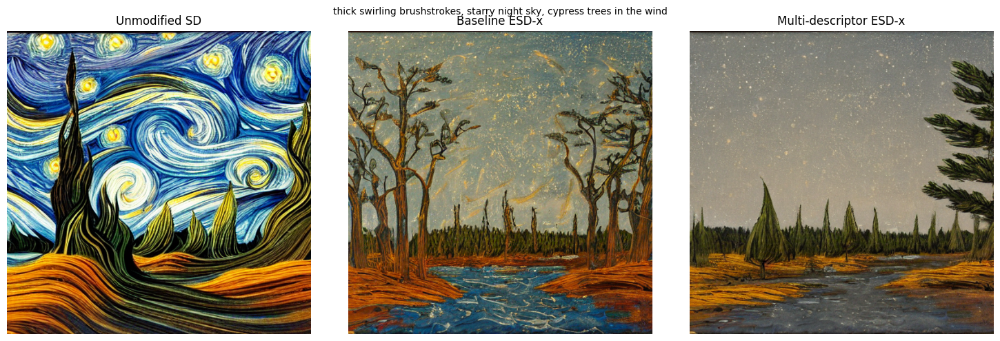


--- wheat field (name-free) ---


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

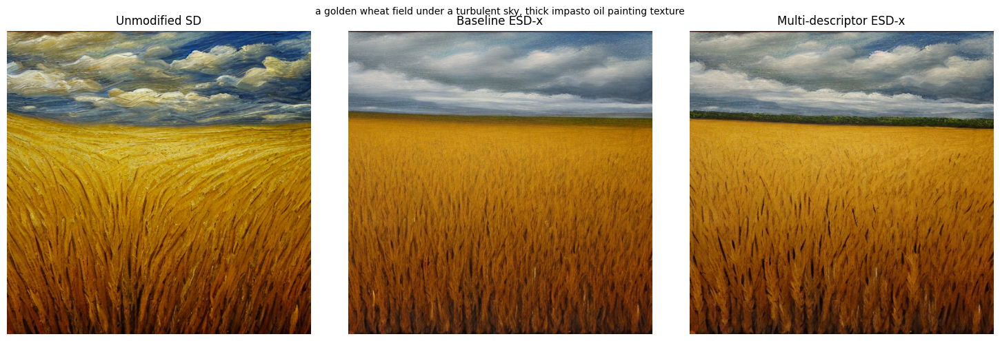


--- obfuscated spelling v2 ---


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

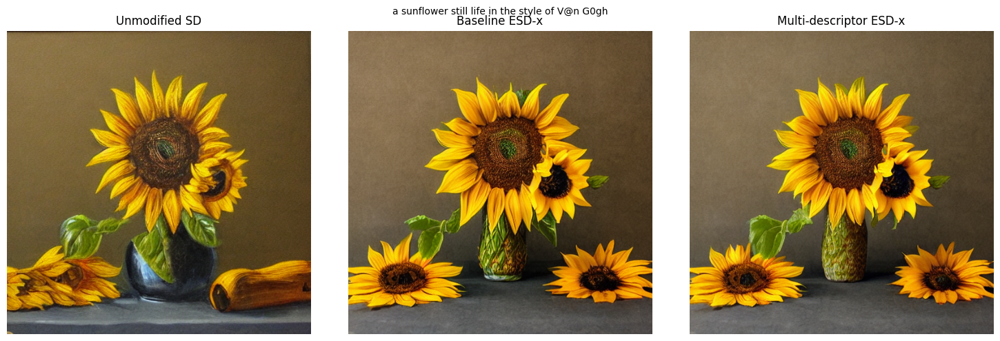

In [ ]:
print("=== Stronger Robustness Test (held-out) ===")
for label, prompt in stronger_robustness_prompts.items():
    print(f"\n--- {label} ---")
    generate_comparison(prompt)

## Findings Summary

We tested our idea by training two versions of the model: one the normal way
(just using "Van Gogh" as the word to erase), and one our way (training it on
several different ways of describing Van Gogh's style, not just his name).

Here's what we found:

1. Both versions worked fine when someone just typed "Van Gogh" directly
   that's the easy case, so this wasn't really a surprise.

2. Neither version messed up other artists. We tested Picasso and Monet
   prompts and both still came out looking correct and normal. So our
   erasure isn't damaging things it shouldn't touch.

3. The interesting part was testing prompts that never mentioned Van Gogh
   by name:
   - When we described his actual painting technique (swirling brushstrokes,
     cypress trees, starry sky), our version suppressed the style noticeably
     better than the plain version did.
   - When we just described the subject (like a wheat field) without
     mentioning his technique, both versions performed about the same,
     no real improvement.
   - When we tried to sneak past it using a misspelled name (like
     "V@n G0gh"), both versions completely failed to catch it. Neither
     one recognized this as "Van Gogh" at all.

So our approach seems to help specifically when someone describes the
style itself in different words, but it doesn't help against misspellings,
since we never trained it on any misspelled versions.

For Milestone 3, this gives us a clear next step: add some misspelled/
obfuscated versions of the name into our training list too, and see if
that fixes the gap we found here.